# Neuroimaging viewing with nilearn

## Setup and add code to read in data

In [1]:
import json

import matplotlib as mpl
import nibabel as nib
from nilearn import plotting

In [2]:
def read_json(json_file):
    """
    Read in json_file, which is in json format, and
    output a dict with its contents
    """
    with open(json_file) as data_file:
        data = json.load(data_file)
    return data

In [3]:
def convert_rgb(color_map):
    """
    Convert RGB values for each structure into floats
    """
    for structure in color_map:
        rgb_color = color_map[structure][1][0]
        if rgb_color == "none":
            continue
        else:
            rgb_float = tuple(value / 255 for value in rgb_color)
            color_map[structure][1][0] = rgb_float
    return color_map


def load_and_relabel(image, mapping, relabel=False):
    """ 
    Load a segmentation image, and relabel values based off of mapping
    
    Return the data as well as the affine matrix for that image
    """
    img = nib.load(image)
    img_data = img.get_fdata()

    if relabel:
        for structure in mapping:
            output_value = mapping[structure][1][-1]
            for replacement_value in mapping[structure][1][-2]:
                img_data[img_data == replacement_value] = output_value
        # to make sure any other random structures in the FSColorLUT that aren't caught
        # don't mess with the scaling for screenshots, replace anything out of the range with Unknown
        # range of labels: 101-114, unknown == 100
        img_data[img_data > 114] = 100
        img_data[img_data < 100] = 100


    return img_data, img.affine

## Read in and remap color

The segmentation image we're using, `aparc.lobes_plus_aseg.mgz`, is created using FreeSurfer, labeling regions anatomical regions of the brain with a different color.
The colors are specifed using the [FreeSurfer Color Lookup Table](https://surfer.nmr.mgh.harvard.edu/fswiki/FsTutorial/AnatomicalROI/FreeSurferColorLUT), where each label ID in the segmenation image maps to a structure name and RGB values.

To simplify viewing of the results, we specify a continuous mapping of 15 different values in the `config`. We create a new `seg_img`, which is a remapping of the values of the original segmentation image to this continuous range.

In [4]:
config = '../data/config.json'
seg_image = '../data/aparc.lobes_plus_aseg.mgz'
original_image = '../data/orig.mgz'

In [5]:
raw_color_mapping = read_json(config)["color_mapping"]
color_mapping = convert_rgb(raw_color_mapping)
color_list = [color_mapping[structure][1][0] for structure in color_mapping]
label_number_bounds = [
    color_mapping[structure][1][-1] for structure in color_mapping
]
label_number_bounds.append(
    label_number_bounds[-1] + 1
)  # needs to be 1 more than the number of colors
cmap = mpl.colors.ListedColormap(color_list, name="fs_lut")

In [6]:
seg_data, affine = load_and_relabel(seg_image, mapping=color_mapping, relabel=True)
seg_img = nib.Nifti1Image(seg_data, affine)

## Interactive image

An interactive image is created by loading the `seg_img` on top of the `original_image` (the brain MRI data).

This can be viewed directly in a notebook, or saved as an HTML file for viewing in a web browser

In [7]:
interactive_image = plotting.view_img(seg_img,
                                      bg_img=original_image,
                                      cmap=cmap,
                                      vmin=100,
                                      vmax=115, 
                                      symmetric_cmap=False,
                                      black_bg=True,
                                      threshold=None,
                                      opacity=0.2,
                                      colorbar=False,
                                      title='subject_name'
                                     )

In [8]:
interactive_image.height = 600
interactive_image.width = 1000


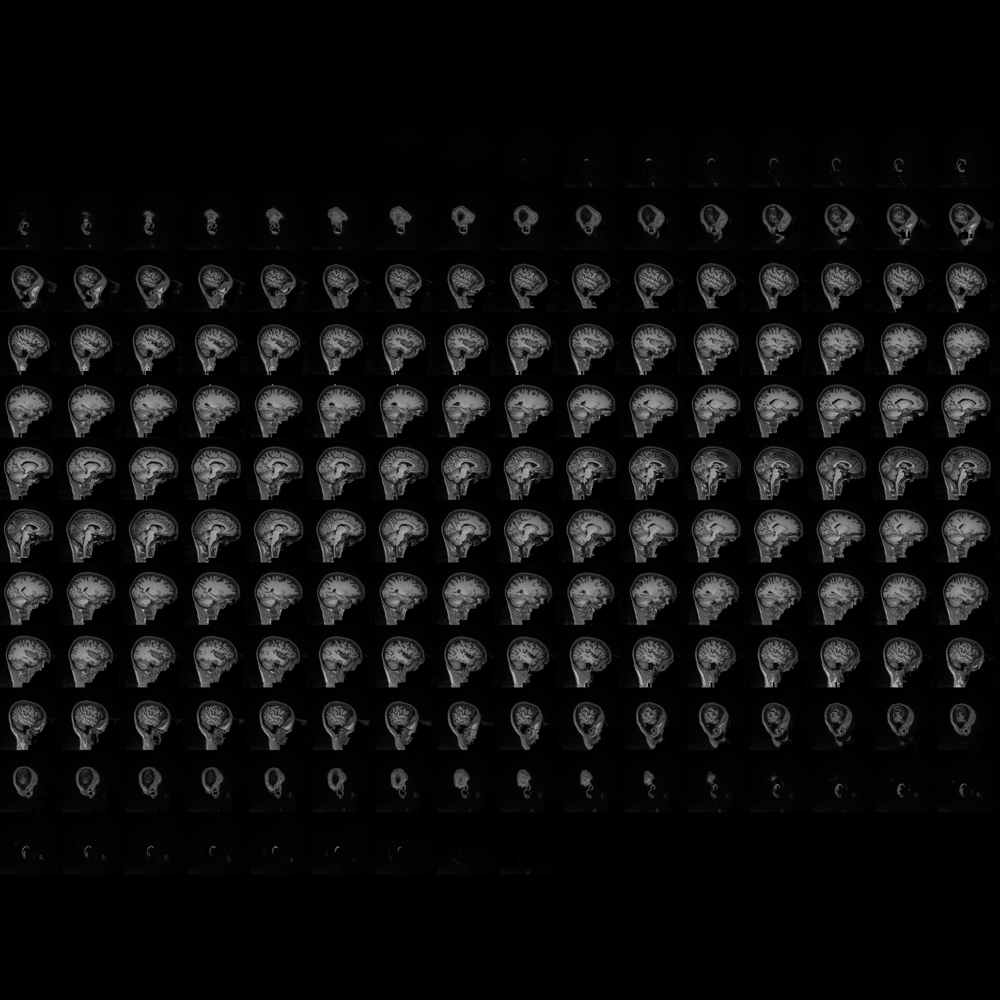
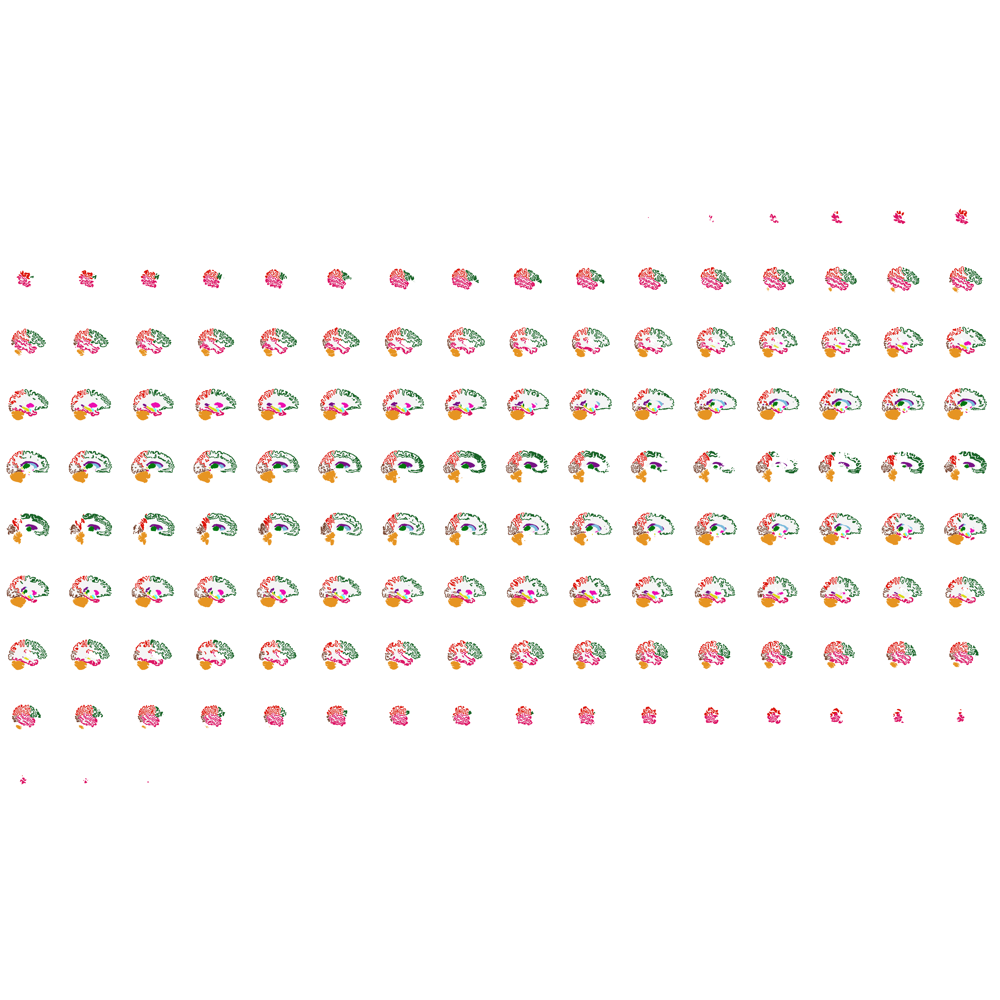

In [11]:
interactive_image

In [12]:
interactive_image.save_as_html('../results/subject_segmentation.html')